# 課題　クラウドファンデイングが成功するか事前に予測

データセットはkickstarter Projectsを用いる。  
クラウドファンデイングが成功するか失敗するかの2値分類問題で、使うモデルはロジスティック回帰である。  
このデータにどんな項目があるのか見てみる。

## 1. データについて
### 1.1. 各項の意味
![](date.pdf)
このように15項目がある  
意味が被っているものがあり、何をみるべきか考えるべきだ。

### 1.2 データの確認、情報

In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import log_loss, accuracy_score, confusion_matrix,recall_score,precision_score
from sklearn.preprocessing import StandardScaler
import seaborn as sns

In [2]:
df_kickstarter = pd.read_csv("ks-projects-201801.csv")

df_kickstarter.head()

,ID,name,category,main_category,currency,deadline,goal,launched,pledged,state,backers,country,usd pledged,usd_pledged_real,usd_goal_real
0,1000002330,The Songs of Adelaide & Abullah,Poetry,Publishing,GBP,2015-10-09,1000.0,2015-08-11 12:12:28,0.0,failed,0,GB,0.0,0.0,1533.95
1,1000003930,Greeting From Earth: ZGAC Arts Capsule For ET,Narrative Film,Film & Video,USD,2017-11-01,30000.0,2017-09-02 04:43:57,2421.0,failed,15,US,100.0,2421.0,30000.00
2,1000004038,Where is Hank?,Narrative Film,Film & Video,USD,2013-02-26,45000.0,2013-01-12 00:20:50,220.0,failed,3,US,220.0,220.0,45000.00
3,1000007540,ToshiCapital Rekordz Needs Help to Complete Album,Music,Music,USD,2012-04-16,5000.0,2012-03-17 03:24:11,1.0,failed,1,US,1.0,1.0,5000.00
4,1000011046,Community Film Project: The Art of Neighborhoo...,Film & Video,Film & Video,USD,2015-08-29,19500.0,2015-07-04 08:35:03,1283.0,canceled,14,US,1283.0,1283.0,19500.00


In [3]:
df_kickstarter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 378661 entries, 0 to 378660
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   ID                378661 non-null  int64  
 1   name              378657 non-null  object 
 2   category          378661 non-null  object 
 3   main_category     378661 non-null  object 
 4   currency          378661 non-null  object 
 5   deadline          378661 non-null  object 
 6   goal              378661 non-null  float64
 7   launched          378661 non-null  object 
 8   pledged           378661 non-null  float64
 9   state             378661 non-null  object 
 10  backers           378661 non-null  int64  
 11  country           378661 non-null  object 
 12  usd pledged       374864 non-null  float64
 13  usd_pledged_real  378661 non-null  float64
 14  usd_goal_real     378661 non-null  float64
dtypes: float64(5), int64(2), object(8)
memory usage: 43.3+ MB


データの総数は378661である。  
欠損値がありそうなので確認。

In [4]:
df_kickstarter.isnull().sum()

ID                     0
name                   4
category               0
main_category          0
currency               0
deadline               0
goal                   0
launched               0
pledged                0
state                  0
backers                0
country                0
usd pledged         3797
usd_pledged_real       0
usd_goal_real          0
dtype: int64

nameが4つ、usd pledgedが3797個欠損値ある。  
この欠損値をどう処理するか次見てみる。

## 2. 欠損値処理
先ほど2つの項目で欠損値が見られた。このままではモデルに使えないので処理してこう
### 2.1 name
データ数3786661に対して欠損値は4。テストデータも豊富で、欠損値も少ないので単純に欠損値のものを省こう。

In [5]:
df_drop_name_kickstarter = df_kickstarter.dropna(subset=['name'])

### 2.2 usd pledged
この項目は集まった資金の米ドル換算であるが、同じ意味の項目のusd_pledged_realがある。  
usd pledgedとusd_pledged_realの違いは換算の方法であるが、usd_pledged_realの方がusd_goal_realと換算方法も同じで扱いやすい。  
欠損値のあるusd pledgedの列は無視しよう。

In [6]:
df_drop_kickstarter = df_drop_name_kickstarter.drop(["usd pledged"],axis = 1)
df_drop_kickstarter.info()
df_drop_kickstarter.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 378657 entries, 0 to 378660
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   ID                378657 non-null  int64  
 1   name              378657 non-null  object 
 2   category          378657 non-null  object 
 3   main_category     378657 non-null  object 
 4   currency          378657 non-null  object 
 5   deadline          378657 non-null  object 
 6   goal              378657 non-null  float64
 7   launched          378657 non-null  object 
 8   pledged           378657 non-null  float64
 9   state             378657 non-null  object 
 10  backers           378657 non-null  int64  
 11  country           378657 non-null  object 
 12  usd_pledged_real  378657 non-null  float64
 13  usd_goal_real     378657 non-null  float64
dtypes: float64(4), int64(2), object(8)
memory usage: 43.3+ MB


ID                  0
name                0
category            0
main_category       0
currency            0
deadline            0
goal                0
launched            0
pledged             0
state               0
backers             0
country             0
usd_pledged_real    0
usd_goal_real       0
dtype: int64

欠損値はなくなり、項目数は14になり、データ数は378657になった。

## 3. 目的変数と説明変数
処理がしやすいように、bool値や数値に変換できるものはする。  
また意味のない変数は落としていく。
### 3.1 目的変数 (state)
目的変数はプロジェクトの状態を表すstateである。  
どんなものがあるか見てみると

In [7]:
df_drop_kickstarter.state.value_counts()

failed        197716
successful    133956
canceled       38779
undefined       3562
live            2799
suspended       1845
Name: state, dtype: int64

成功か失敗かを予測したいので、failedとsuccessfulだけにして、他は捨てた方が良いだろう。  
また、扱いやすいように"True"、"False"のbool値に

In [8]:
df_drop_kickstarter = df_drop_kickstarter[(df_drop_kickstarter["state"] == "failed") | (df_drop_kickstarter["state"] == "successful")]
df_drop_kickstarter["state"] = (df_drop_kickstarter["state"] == "successful")
df_drop_kickstarter.state.value_counts()

False    197716
True     133956
Name: state, dtype: int64

### 3.2 説明変数
今、説明変数は13個ある。  
取捨選択や変数をまとめてみる。  
また詳しい統計は別ファイルの[kickstarter.html](kickstarter.html)にある。これも参考にする
### 3.2.1 意味が被っているもの
カテゴリはcategoryとmain_categoryがある。  
[kickstarter.html](kickstarter.html)をみるとdistinctがcategoryは159、main_categoryは15。少ない方がまとまっていて扱いやすいのでmain_categoryを採用。

集まった資金とゴール額が2つずつある。それぞれ米ドル換算した方が比較しやすいのでusd_pledged_real、usd_goal_realを採用。

In [9]:
df_date = df_drop_kickstarter.drop(["category","pledged","goal"],axis = 1)

### 3.2.2 2変数を1つに
launchedとdeadlineはその日に大きな意味を持つより、deadlineからlaunchedを引いた期間の方が重要そう。また、1つにまとまって良い。

In [10]:
#今launchedとdeadlineの型
print(df_date.launched.dtype)
#datetime型に変換
df_date.launched = pd.to_datetime(df_date["launched"])
df_date.deadline = pd.to_datetime(df_date["deadline"])
print(df_date.launched.dtype)
#クラウドファンディング期間を求める
df_date["Days"]=df_date["deadline"]-df_date["launched"]
print(df_date.Days.dtype)
#細かいデータでなく日数にする。pd.Seriesの日付属性dayを使って
df_date["Days"] = df_date["Days"].dt.days
df_date = df_date.drop(["launched","deadline"],axis = 1)

object
datetime64[ns]
timedelta64[ns]


### 3.2.3 予測に役立たないもの、使っていけないもの
明らかにIDと名前はいらないだろう

In [11]:
df_date = df_date.drop(["ID","name"],axis = 1)

また、予測に使っていけないと思われる変数がある。  
それは予測時に持っていない変数。つまりクラウドファンディング後に得られる変数である。  
集まった資金と支援者の項目は消そう。usd_pledged_realとbackers

In [12]:
df_date = df_date.drop(["usd_pledged_real","backers"],axis = 1)
df_date.head()

,main_category,currency,state,country,usd_goal_real,Days
0,Publishing,GBP,False,GB,1533.95,58
1,Film & Video,USD,False,US,30000.00,59
2,Film & Video,USD,False,US,45000.00,44
3,Music,USD,False,US,5000.00,29
5,Food,USD,True,US,50000.00,34


こんな感じになった。  
説明変数は5つになった。ちょっと削りすぎたかな？  
データ数もstateで削ったので331672個。十分にあるだろう。

## 4. 目的変数と説明変数の関係
### 4.1 ゴール額と期間

In [13]:
# 相関係数を確認
df_date_num = df_date.loc[:,["state","usd_goal_real","Days"]]
df_date_num.corr()

,state,usd_goal_real,Days
state,1.000000,-0.023735,-0.116438
usd_goal_real,-0.023735,1.000000,0.021606
Days,-0.116438,0.021606,1.000000


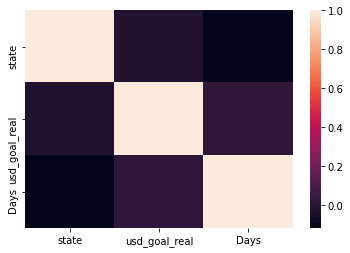

In [14]:
# 相関係数をヒートマップにして可視化
sns.heatmap(df_date_num.corr())
plt.show()

数値のものはこんな感じになった。  
objectの相関はこうなった。1が成功、0が失敗

### 4.2 メインカテゴリ

<AxesSubplot:xlabel='count', ylabel='main_category'>

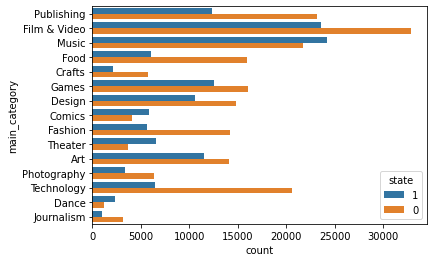

In [15]:
sns.countplot(y="main_category", hue="state", hue_order=[1,0], data=df_date)

### 4.3 使用通貨

<AxesSubplot:xlabel='count', ylabel='currency'>

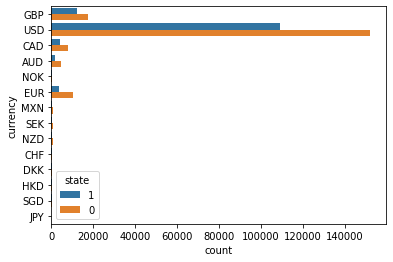

In [16]:
sns.countplot(y="currency", hue="state", hue_order=[1,0], data=df_date)

### 4.4 プロジェクトが開かれた国

<AxesSubplot:xlabel='count', ylabel='country'>

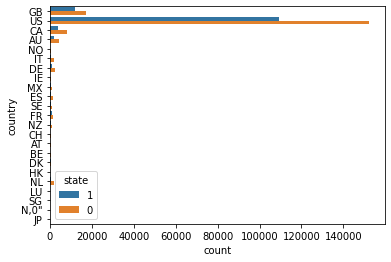

In [17]:
sns.countplot(y="country", hue="state", hue_order=[1,0], data=df_date)

## 5. 前処理
データを標準化し、説明変数の相関を取り、大事な説明変数の選択を行う。
### 5.1. 質的変数をダミー変数に
このままではモデルに入れれないので、ダミー変数に変化させる。

In [18]:
#use_col = ["main_category","currency","country"]

df_date_dummy = pd.get_dummies(df_date)
df_date_dummy.head()
df_date_dummy.to_csv('Day1_date.csv')
df_date_dummy.head()

,state,usd_goal_real,Days,main_category_Art,main_category_Comics,main_category_Crafts,main_category_Dance,main_category_Design,main_category_Fashion,main_category_Film & Video,...,country_JP,country_LU,country_MX,"country_N,0""",country_NL,country_NO,country_NZ,country_SE,country_SG,country_US
0,False,1533.95,58,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,False,30000.00,59,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
2,False,45000.00,44,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
3,False,5000.00,29,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,True,50000.00,34,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


### 5.2 標準化

In [21]:
from sklearn.preprocessing import StandardScaler
stdsc = StandardScaler()
df_standar = df_date_dummy.copy()
col_names = ['usd_goal_real', 'Days']
features = df_date_dummy[col_names]
scaler = StandardScaler().fit(features.values)
features = scaler.transform(features.values)
df_standar[col_names] = features 
df_standar.head()

,state,usd_goal_real,Days,main_category_Art,main_category_Comics,main_category_Crafts,main_category_Dance,main_category_Design,main_category_Fashion,main_category_Film & Video,...,country_JP,country_LU,country_MX,"country_N,0""",country_NL,country_NO,country_NZ,country_SE,country_SG,country_US
0,False,-0.036049,1.969999,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,False,-0.010379,2.048657,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
2,False,0.003147,0.868787,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
3,False,-0.032923,-0.311084,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,True,0.007656,0.082206,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


### 5.3 説明変数の相関について
国と通貨は関連が強そう、今回は通貨を採択する。

In [22]:
df_standar.columns[32:]
drop_col = df_standar.columns[32:]
df_drop_date = df_standar.drop(drop_col,axis = 1)
df_drop_date.columns

Index(['state', 'usd_goal_real', 'Days', 'main_category_Art',
       'main_category_Comics', 'main_category_Crafts', 'main_category_Dance',
       'main_category_Design', 'main_category_Fashion',
       'main_category_Film & Video', 'main_category_Food',
       'main_category_Games', 'main_category_Journalism',
       'main_category_Music', 'main_category_Photography',
       'main_category_Publishing', 'main_category_Technology',
       'main_category_Theater', 'currency_AUD', 'currency_CAD', 'currency_CHF',
       'currency_DKK', 'currency_EUR', 'currency_GBP', 'currency_HKD',
       'currency_JPY', 'currency_MXN', 'currency_NOK', 'currency_NZD',
       'currency_SEK', 'currency_SGD', 'currency_USD'],
      dtype='object')

### 5.4 予測に効く説明変数
ステップワイズ法を用いて、大切な説明変数を見つける

In [24]:
#スッテプワイズ法
from sklearn.feature_selection import RFECV
estimator = SGDClassifier(loss='log', penalty='none', max_iter=10000, fit_intercept=True, random_state=1234, tol=1e-3 )
rfecv = RFECV(estimator, cv=10, scoring='accuracy')
y = df_drop_date["state"].values
X = df_drop_date.drop("state", axis=1).values
rfecv.fit(X, y)

RFECV(cv=10,
      estimator=SGDClassifier(alpha=0.0001, average=False, class_weight=None,
                              early_stopping=False, epsilon=0.1, eta0=0.0,
                              fit_intercept=True, l1_ratio=0.15,
                              learning_rate='optimal', loss='log',
                              max_iter=10000, n_iter_no_change=5, n_jobs=None,
                              penalty='none', power_t=0.5, random_state=1234,
                              shuffle=True, tol=0.001, validation_fraction=0.1,
                              verbose=0, warm_start=False),
      min_features_to_select=1, n_jobs=None, scoring='accuracy', step=1,
      verbose=0)

In [25]:
print('Feature ranking: \n{}'.format(rfecv.ranking_))
remove_idx = ~rfecv.support_
remove_feature = df_drop_date.drop("state", axis=1).columns[remove_idx]
selected_train_data = df_drop_date.drop(remove_feature, axis=1)
selected_train_data

Feature ranking: 
[1 1 9 1 1 1 3 1 8 1 2 1 1 1 1 1 1 1 5 7 1 1 1 1 1 1 1 4 6 1 1]


,state,usd_goal_real,Days,main_category_Comics,main_category_Crafts,main_category_Dance,main_category_Fashion,main_category_Food,main_category_Journalism,main_category_Music,...,currency_AUD,currency_DKK,currency_EUR,currency_GBP,currency_HKD,currency_JPY,currency_MXN,currency_NOK,currency_SGD,currency_USD
0,False,-0.036049,1.969999,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,False,-0.010379,2.048657,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,False,0.003147,0.868787,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,False,-0.032923,-0.311084,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
5,True,0.007656,0.082206,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378654,False,-0.031571,-0.311084,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
378657,False,-0.036079,-0.547058,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
378658,False,-0.023906,0.947445,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
378659,False,-0.023906,-0.232426,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


### 5.5 説明変数間の相関がないか確認
多重共線性が無いことを確認する。　10以下ならOK

In [26]:
from sklearn.linear_model import LinearRegression

print("VIFの計算")
df = selected_train_data.drop("state", axis=1)
for cname in df.columns:  
    y=df[cname]
    X=df.drop(cname, axis=1)
    regr = LinearRegression(fit_intercept=True)
    regr.fit(X, y)
    rsquared = regr.score(X,y)
    print(cname,":" ,1/(1-np.power(rsquared,2)))

VIFの計算
usd_goal_real : 1.0000009579251448
Days : 1.0000618888897503
main_category_Comics : 1.0015844318737812
main_category_Crafts : 1.001051513477537
main_category_Dance : 1.0002425163806787
main_category_Fashion : 1.0053885003045813
main_category_Food : 1.0062919728659876
main_category_Journalism : 1.0003081753713299
main_category_Music : 1.0196987745514001
main_category_Photography : 1.0015160927112985
main_category_Publishing : 1.0128463038318698
main_category_Technology : 1.010464344255785
main_category_Theater : 1.0018339910745115
currency_AUD : 1.0857784943139777
currency_DKK : 1.0028148531406285
currency_EUR : 1.2593859051586744
currency_GBP : 1.6183642239775504
currency_HKD : 1.000812431835536
currency_JPY : 1.0000021784770092
currency_MXN : 1.0061967991433152
currency_NOK : 1.0011583821702346
currency_SGD : 1.0007359790638792
currency_USD : 2.152444191446391


相関はなさそうだ  
## 6. モデルの検証
今回はロジスティック回帰、決定木、ランダムフォレスト、アダブースト、tensorflowを作ってみる。  
ホールドアウト法を用いてAccuracy、precission、recallを求め、比較する
### 6.1 ロジスティック回帰

In [27]:
from sklearn.model_selection import train_test_split # ホールドアウト法に関する関数
test_size = 0.2
y = selected_train_data["state"].values
X = selected_train_data.drop("state", axis=1).values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=1234)

clf = SGDClassifier(loss='log', penalty='none', max_iter=10000, fit_intercept=True, random_state=1234, tol=1e-3, )
clf.fit(X_train, y_train)

# ラベルを予測
y_est = clf.predict(X_test)

# 確率値を得る
y_est_proba = clf.predict_proba(X_test)

# 対数尤度を表示
# log_lossという関数は、負の対数尤度を返す
# normalizeという引数をTrueにすると、合計の対数尤度ではなく平均の対数尤度が計算される
print('対数尤度 = {:.3f}'.format(- log_loss(y_test, y_est_proba, normalize=False))) 

# 正答率を表示
print('正答率 = {:.3f}%'.format(100 * accuracy_score(y_test, y_est)))

対数尤度 = -41846.241
正答率 = 64.339%


In [28]:
# ラベルを予測
y_est = clf.predict(X_test)

# 予測値と正解のクロス集計
conf_mat = pd.DataFrame(confusion_matrix(y_test, y_est), 
                        index=['正解 = 成功', '正解 = 失敗'], 
                        columns=['予測 = 成功', '予測 = 失敗'])
display(conf_mat)

print("Accuracy: {:.5f}".format(accuracy_score(y_test, y_est)))
print("precission : {:.5f}".format(precision_score(y_test, y_est)))
print("recall : {:.5f}".format(recall_score(y_test, y_est)))

,予測 = 成功,予測 = 失敗
正解 = 成功,34331,5218
正解 = 失敗,18438,8348


Accuracy: 0.64339
precission : 0.61536
recall : 0.31166


### 6.2 決定木

In [41]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
#ジニ係数で判断,max_depth どんだけ深くするか,min_sample_split どんだけデータがあれば枝をはるか,min_samples_leaf 枝の葉っぱに最低何個あるか
clf = DecisionTreeClassifier(criterion="gini", max_depth=10, min_samples_split=3, min_samples_leaf=3, random_state=1234)
clf = clf.fit(X_train, y_train)
print("score=", clf.score(X_train, y_train))
print(clf.predict(X_test)) #予測したい場合

score= 0.6554758665395327
[False False  True ...  True  True False]


In [42]:
# ラベルを予測
y_est = clf.predict(X_test)

# 予測値と正解のクロス集計
conf_mat = pd.DataFrame(confusion_matrix(y_test, y_est), 
                        index=['正解 = 成功', '正解 = 失敗'], 
                        columns=['予測 = 成功', '予測 = 失敗'])
display(conf_mat)

print("Accuracy: {:.5f}".format(accuracy_score(y_test, y_est)))
print("precission : {:.5f}".format(precision_score(y_test, y_est)))
print("recall : {:.5f}".format(recall_score(y_test, y_est)))

,予測 = 成功,予測 = 失敗
正解 = 成功,32442,7107
正解 = 失敗,16175,10611


Accuracy: 0.64902
precission : 0.59888
recall : 0.39614


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.327058 to fit



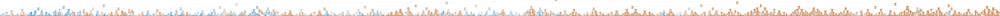

In [43]:
# 決定木の描画
import graphviz
import pydotplus
from IPython.display import Image
from sklearn.externals.six import StringIO
X_name = selected_train_data.drop("state", axis=1)
dot_data = StringIO() #dotファイル情報の格納先
export_graphviz(clf, out_file=dot_data,  
                     feature_names=X_name.columns,  
                     class_names=["True","False"],  
                     filled=True, rounded=True,  
                     special_characters=True) 
graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
Image(graph.create_png())

### 6.3 ランダムフォレスト

In [34]:
#ランダムフォレスト
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=10, max_depth=4, criterion="gini",
                                                 min_samples_leaf=2, min_samples_split=2, random_state=1234)
clf.fit(X_train, y_train)
print("score=", clf.score(X_train, y_train))

score= 0.6202678103694547


In [35]:
# ラベルを予測
y_est = clf.predict(X_test)

# 予測値と正解のクロス集計
conf_mat = pd.DataFrame(confusion_matrix(y_test, y_est), 
                        index=['正解 = 成功', '正解 = 失敗'], 
                        columns=['予測 = 成功', '予測 = 失敗'])
display(conf_mat)

print("Accuracy: {:.5f}".format(accuracy_score(y_test, y_est)))
print("precission : {:.5f}".format(precision_score(y_test, y_est)))
print("recall : {:.5f}".format(recall_score(y_test, y_est)))

,予測 = 成功,予測 = 失敗
正解 = 成功,38419,1130
正解 = 失敗,24027,2759


Accuracy: 0.62076
precission : 0.70944
recall : 0.10300


0


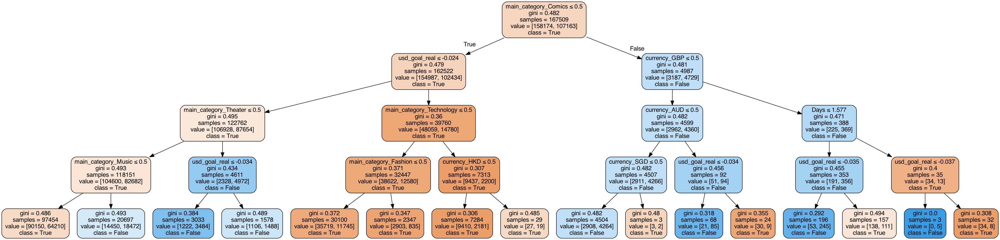

1


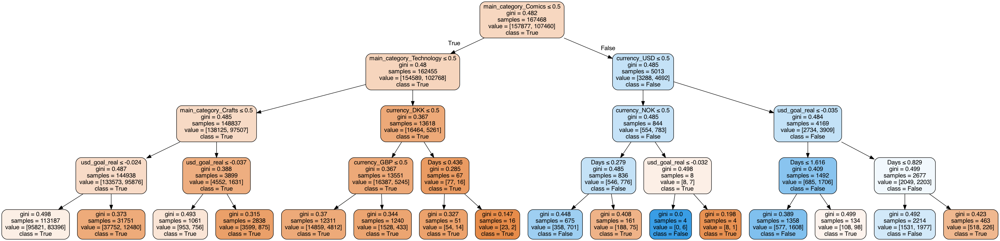

2


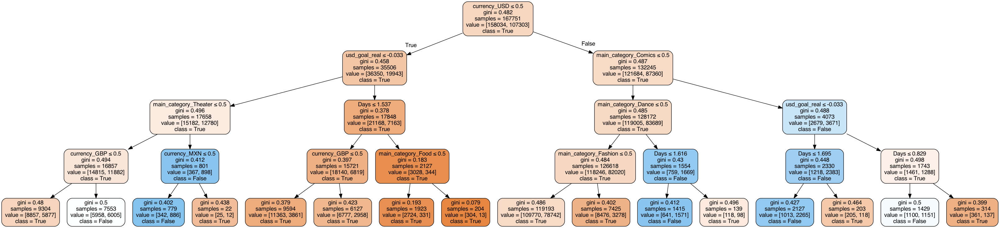

3


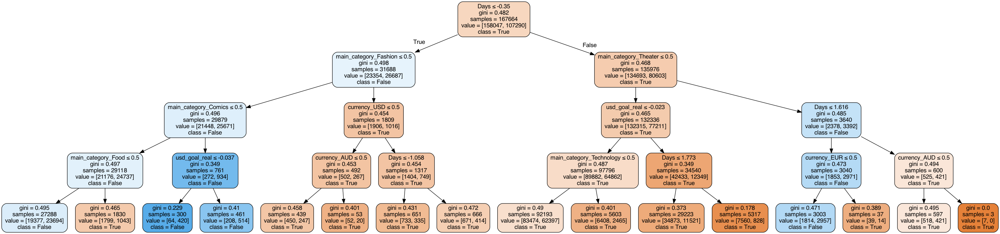

4


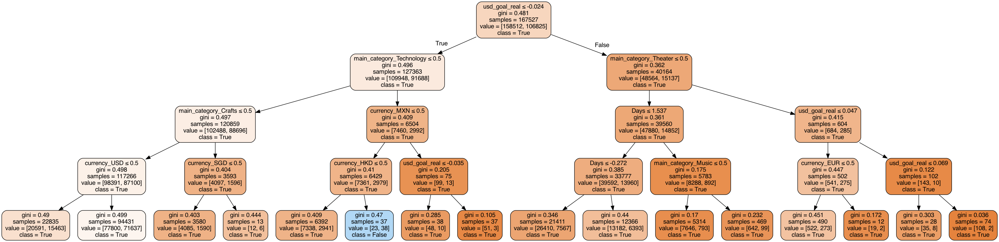

5


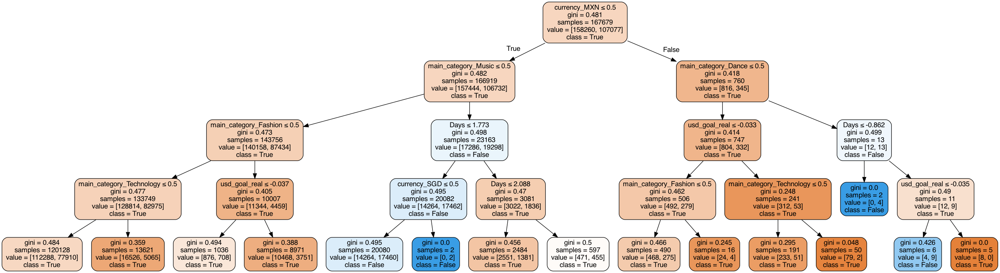

6


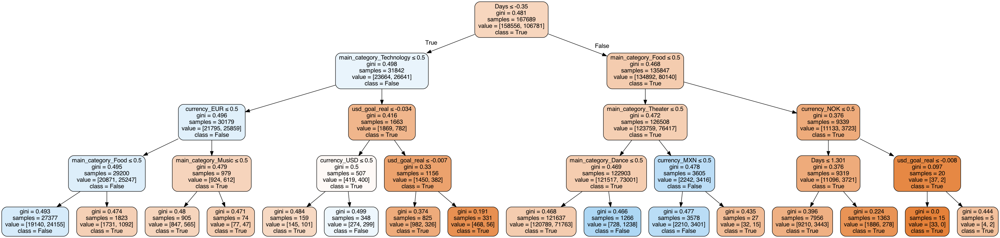

7


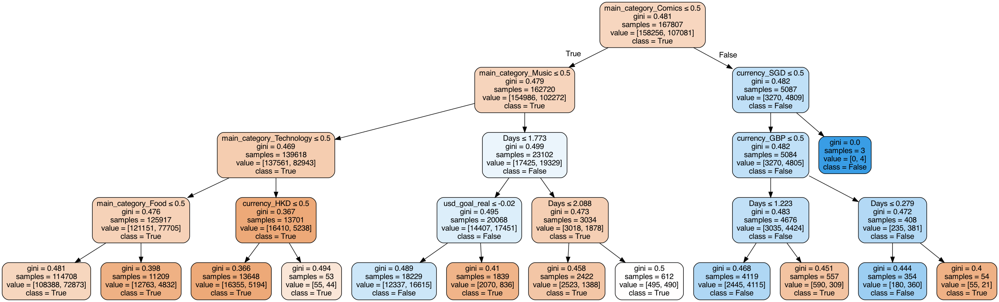

8


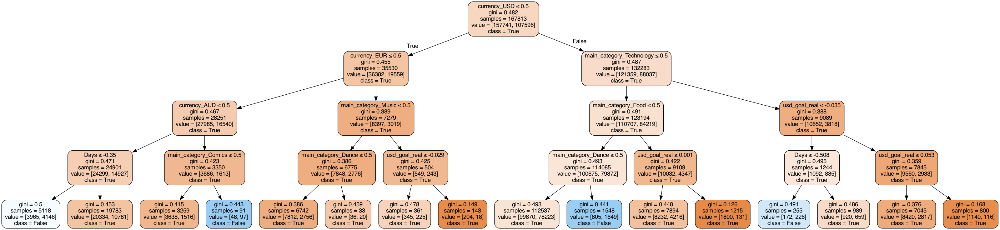

9


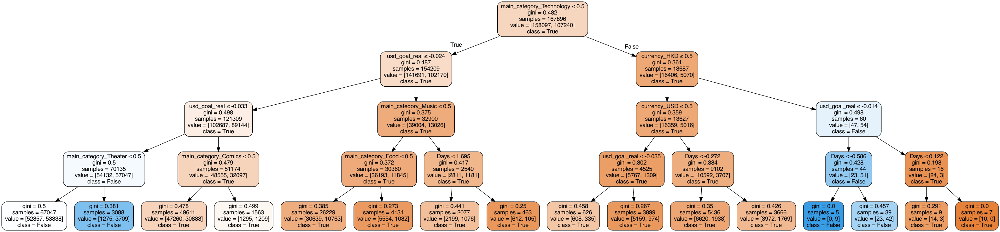

In [36]:
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image
from sklearn.externals.six import StringIO

for i, est in enumerate(clf.estimators_):
    print(i)
    
    # 決定木の描画
    dot_data = StringIO() #dotファイル情報の格納先
    export_graphviz(est, out_file=dot_data,  
                         feature_names=X_name.columns,  
                     class_names=["True","False"], 
                         filled=True, rounded=True,  
                         special_characters=True) 
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
    display(Image(graph.create_png()))

### 6.4　アダブースト

In [44]:
from sklearn.ensemble import AdaBoostClassifier
clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=4,
                                                                                 min_samples_leaf=2,
                                                                                 min_samples_split=2, 
                                                                                 random_state=1234,
                                                                                 criterion="gini"),
                                           n_estimators=10, random_state=1234)
clf.fit(X_train, y_train)
print("score=", clf.score(X_train, y_train))

score= 0.6609255399736939


In [45]:
# ラベルを予測
y_est = clf.predict(X_test)

# 確率値を得る
y_est_proba = clf.predict_proba(X_test)
# 予測値と正解のクロス集計
conf_mat = pd.DataFrame(confusion_matrix(y_test, y_est), 
                        index=['正解 = 成功', '正解 = 失敗'], 
                        columns=['予測 = 成功', '予測 = 失敗'])
display(conf_mat)

print("Accuracy: {:.5f}".format(accuracy_score(y_test, y_est)))
print("precission : {:.5f}".format(precision_score(y_test, y_est)))
print("recall : {:.5f}".format(recall_score(y_test, y_est)))

,予測 = 成功,予測 = 失敗
正解 = 成功,31325,8224
正解 = 失敗,14534,12252


Accuracy: 0.65692
precission : 0.59836
recall : 0.45740


0


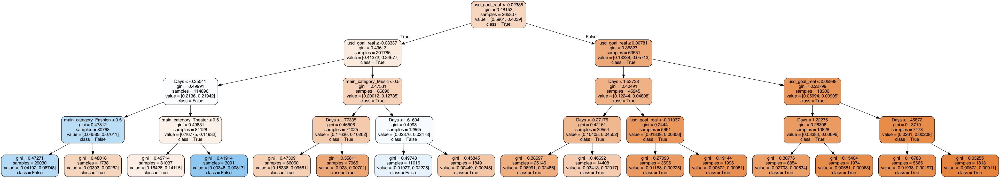

1


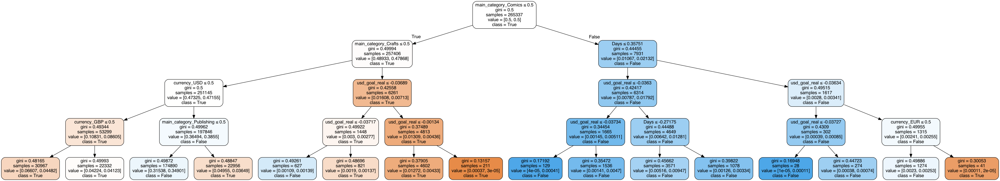

2


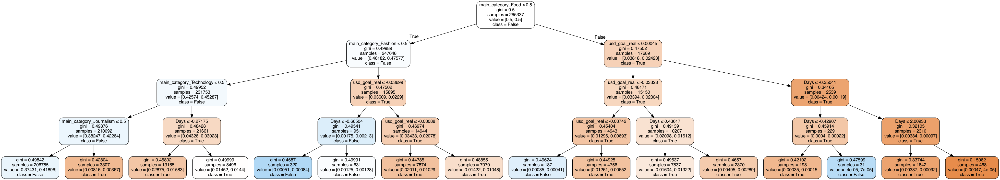

3


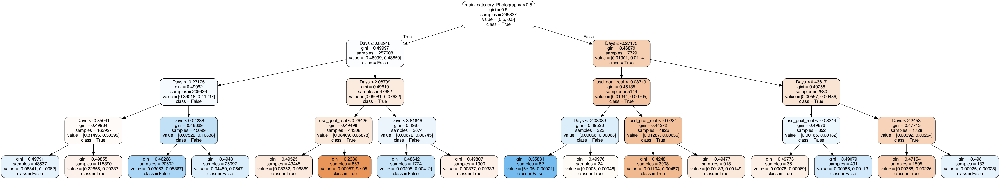

4


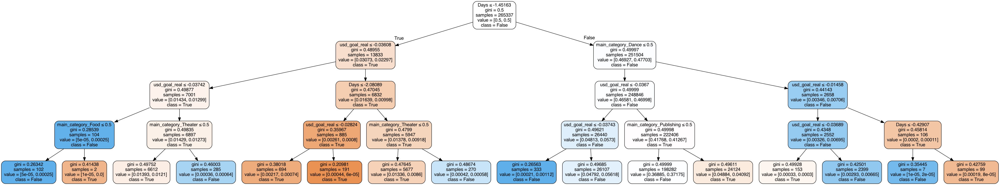

5


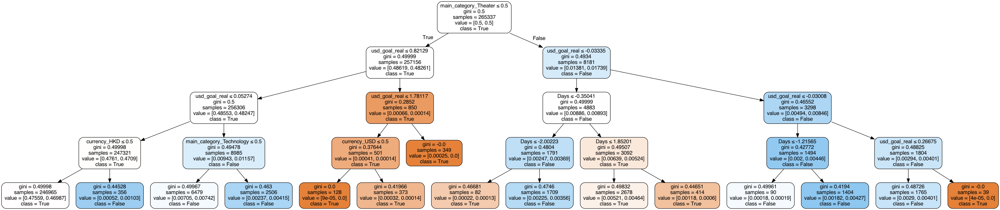

6


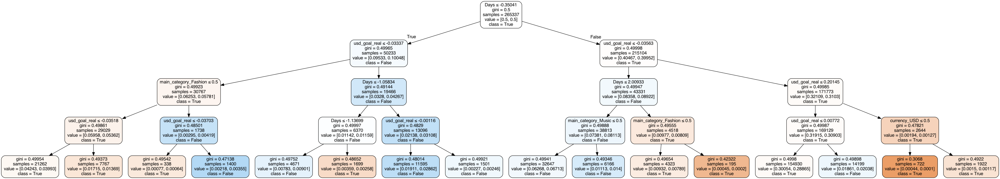

7


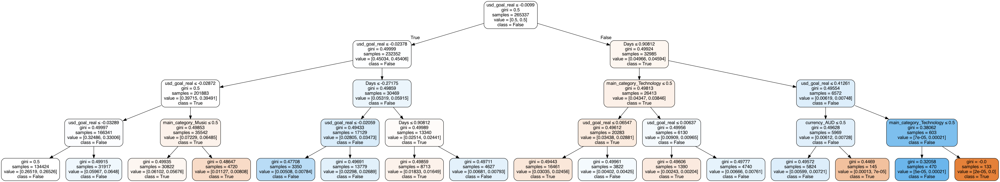

8


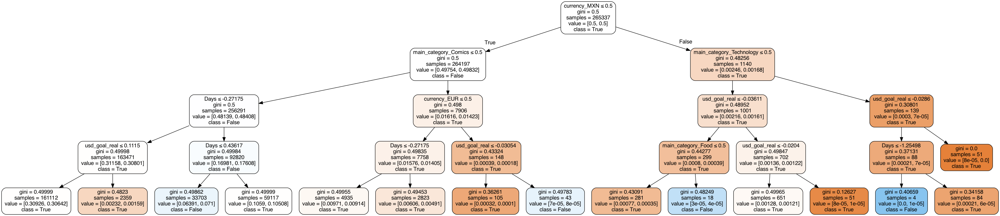

9


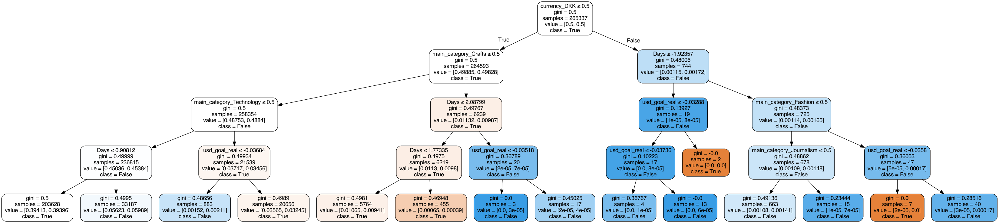

In [46]:
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image
from sklearn.externals.six import StringIO

for i, est in enumerate(clf.estimators_):
    print(i)
    
    # 決定木の描画
    dot_data = StringIO() #dotファイル情報の格納先
    export_graphviz(est, out_file=dot_data,
                           feature_names=X_name.columns,  
                     class_names=["True","False"],
                         filled=True, rounded=True,  
                         special_characters=True,precision=5) 
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
    display(Image(graph.create_png()))
    graph.write_pdf('iris_ada_{}.pdf'.format(i))

### 6.5 Tensorflow

In [47]:
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score,classification_report
from sklearn.metrics import confusion_matrix
from tensorflow import keras  
import tensorflow as tf

/Users/eguchikazuki/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/eguchikazuki/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/eguchikazuki/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/Users/eguchikazuki/opt/anaconda3/lib/python3.7/s

In [51]:
from tensorflow.compat.v1.keras import Sequential
from tensorflow.compat.v1.keras.layers import Dense, Dropout, Activation
from tensorflow.compat.v1.keras.optimizers import SGD,RMSprop, Adagrad, Adadelta, Adam

model = Sequential()
model.add(Dense(35, activation='relu', input_dim=23))
model.add(Dense(15, activation='relu', input_dim=35))
model.add(Dense(5, activation='relu', input_dim=15))
model.add(Dense(2, activation='softmax'))#最終層のactivationは変更しないこと

# ------ 最適化手法 ------
sgd = SGD(lr=0.01, momentum=0.9, nesterov=False)
# rms = RMSprop(lr=0.01)
# adag = Adagrad(lr=0.01)
# adad = Adadelta(lr=0.01)
# adam = Adam(lr=0.01)
# -----------------------------

model.compile(loss='categorical_crossentropy',
              optimizer=sgd,
              metrics=['accuracy'])

# WARNINGが出るが気にしなくて良い

In [52]:
# 計算の実行　30ループ 20個
from keras.utils import np_utils
y_train_onehot = np_utils.to_categorical(y_train)
y_test_onehot = np_utils.to_categorical(y_test)
fit = model.fit(X_train, y_train_onehot,
          epochs=30,
          batch_size=20,validation_data=(X_test, y_test_onehot))

# 各epochにおける損失と精度をdfに入れる
df = pd.DataFrame(fit.history)

Train on 265337 samples, validate on 66335 samples
Epoch 1/30
265337/265337 [==============================] - 19s 72us/sample - loss: 0.6388 - acc: 0.6343 - val_loss: 0.6295 - val_acc: 0.6455
Epoch 2/30
265337/265337 [==============================] - 19s 73us/sample - loss: 0.6301 - acc: 0.6410 - val_loss: 0.6280 - val_acc: 0.6474
Epoch 3/30
265337/265337 [==============================] - 19s 72us/sample - loss: 0.6271 - acc: 0.6452 - val_loss: 0.6255 - val_acc: 0.6394
Epoch 4/30
265337/265337 [==============================] - 29s 109us/sample - loss: 0.6253 - acc: 0.6456 - val_loss: 0.6217 - val_acc: 0.6494
Epoch 5/30
265337/265337 [==============================] - 41s 155us/sample - loss: 0.6240 - acc: 0.6466 - val_loss: 0.6215 - val_acc: 0.6513
Epoch 6/30
265337/265337 [==============================] - 31s 117us/sample - loss: 0.6230 - acc: 0.6474 - val_loss: 0.6409 - val_acc: 0.6216
Epoch 7/30
265337/265337 [==============================] - 30s 115us/sample - loss: 0.6221 - 

In [53]:
from tensorflow.compat.v1.keras.models import load_model

# 保存
model.save('my_model.h5')
del model

# 読み込み
model = load_model('my_model.h5')

# WARNINGが出るが気にしなくて良い
y_pred = np.argmax(model.predict(X_test),axis=1)
# 正答率を表示

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [59]:
# 予測値と正解のクロス集計
conf_mat = pd.DataFrame(confusion_matrix(y_test, y_pred), 
                        index=['正解 = 成功', '正解 = 失敗'], 
                        columns=['予測 = 成功', '予測 = 失敗'])
display(conf_mat)

print("Accuracy: {:.5f}".format(accuracy_score(y_test, y_pred)))
print("precission : {:.5f}".format(precision_score(y_test, y_pred)))
print("recall : {:.5f}".format(recall_score(y_test, y_pred)))

,予測 = 成功,予測 = 失敗
正解 = 成功,27930,11619
正解 = 失敗,11573,15213


Accuracy: 0.65038
precission : 0.56697
recall : 0.56795


まとめた図が以下である

![](date2.pdf)

## 7. 参考したもの
https://github.com/glanzend/skillupai/blob/master/mushroom-classification.ipynb

https://github.com/megadreams14/kaggle/blob/master/mental-health-in-tech-survey/notebook.ipynb